# Imports

In [711]:
from scipy.signal import convolve2d, correlate2d
import numpy as np
import cv2
from matplotlib import pyplot as plt
from typing import List
from scipy import fftpack

from numpy import pi, exp, sqrt
from skimage import io, img_as_ubyte, img_as_float32
import scipy.signal as sig

from skimage.transform import rescale
#from scikit-image import rescale
import os

from numpy import pi, exp, sqrt
import matplotlib.pyplot as plt


# Code

In [712]:
def filter_layer(image: np.ndarray, filter: np.ndarray , reflect_padding:bool):
  """
  Apply a filter to an image. Return the filtered image.
  Inputs:
  - image -> numpy nd-array of dim (m, n, c) for RGB images or numpy nd-array of dim (m, n) for gray scale images
  - filter -> numpy nd-array of odd dim (k, l)
  Returns
  - filtered_image -> numpy nd-array of dim (m, n, c) or numpy nd-array of dim (m, n)
  Errors if:
  - filter has any even dimension -> raise an Exception with a suitable error message.
  """
  try:
    filter = np.flipud(np.fliplr(filter))    # Flip the kernel
    tgt_size = (filter.shape[0] + image.shape[0]-1,filter.shape[1] + image.shape[1]-1)  
    # Add zero padding to the input image 
    image_padded = np.zeros(shape=tgt_size)
    
    startr = int(filter.shape[0] / 2) 
    startc = int(filter.shape[1] / 2)
    image_padded[startr : startr + image.shape[0],startc : startc + image.shape[1]] = image
    '''
    
      This section is for padding with reflect image
    
    '''  
    if(reflect_padding == True):
      image_padded[0:startr,startr:startr+image.shape[1]] = np.flip(image[-1-startr:-1,:],0)
      image_padded[startr+image.shape[0]::,startr:startr+image.shape[1]] = np.flip(image[0:startr,:],0)
      image_padded[:,0:startc] = np.flip(image_padded[:,-1-2*startc:-1-startc],1)
      image_padded[:,startc + image.shape[1]:] = np.flip(image_padded[:,startc:2*startc],1)
    
    filtered_image = np.zeros_like(image)
    for x in range(image.shape[1]):     # Loop over every pixel of the image
        for y in range(image.shape[0]):
            # element-wise multiplication of the kernel and the image
            filtered_image[y,x]=(filter*image_padded[y:y + filter.shape[0], x:x + filter.shape[1]]).sum()
                                  
    return filtered_image
  except Exception as e:
    print(f"Error in {e}")
    return  

In [713]:
# This functino is to handle the different cases of images 
# it calls function ---> filter_layer
def my_imfilter(image: np.ndarray, filter: np.ndarray):
  assert filter.shape[0] % 2 != 0 and filter.shape[1] % 2 != 0  ,"for even filters, the output is undefined"
  
  reflect_padding=  False
  n_channels = len(image.shape)
  if(n_channels < 3):
    
    filtered_image = filter_layer(image,filter,reflect_padding)
    '''
    just to compare the buit it with our function
    '''
    # filtered_image = correlate2d(image[:,:,0], filter, 'same') 
  else:
    blue, green, red = cv2.split(image)

    blue = filter_layer(blue,filter,reflect_padding)
    green = filter_layer(green,filter,reflect_padding)
    red = filter_layer(red,filter,reflect_padding)
    filtered_image = np.dstack((red,green,blue))
    
    '''
        just to compare the buit it with our function
    '''
    # filtered_image = np.array(image)
    # filtered_image[:,:,2] = correlate2d(image[:,:,0], filter, 'same')
    # filtered_image[:,:,1] = correlate2d(image[:,:,1], filter, 'same')
    # filtered_image[:,:,0] = correlate2d(image[:,:,2], filter, 'same') 
    
  return filtered_image


In [714]:
from numpy import dot, exp, mgrid, pi, ravel, square, uint8, zeros
def create_gaussian_filter(k_size, sigma):
  center = k_size // 2
  x, y = mgrid[0 - center : k_size - center, 0 - center : k_size - center]
  G = 1 / (2 * pi * sigma) * exp(-(square(x) + square(y)) / (2 * square(sigma)))
  return G

In [737]:

# Steps:
  # (1) Remove the high frequencies from image1 by blurring it. The amount of
  #     blur that works best will vary with different image pairs
  # generate a gaussian kernel with mean=0 and sigma = cutoff_frequency,
  # Just a heads up but think how you can generate 2D gaussian kernel from 1D gaussian kernel
  
   # (2) Remove the low frequencies from image2. The easiest way to do this is to
  #     subtract a blurred version of image2 from the original version of image2.
  #     This will give you an image centered at zero with negative values.
  
    # (3) Combine the high frequencies and low frequencies
  
   # (4) At this point, you need to be aware that values larger than 1.0
  # or less than 0.0 may cause issues in the functions in Python for saving
  # images to disk. These are called in proj1_part2 after the call to 
  # gen_hybrid_image().
  # One option is to clip (also called clamp) all values below 0.0 to 0.0, 
  # and all values larger than 1.0 to 1.0.
  
  # (5) As a good software development practice you may add some checks (assertions) for the shapes
  # and ranges of your results. This can be performed as test for the code during development or even
  # at production!
  
def gen_hybrid_image(image1: np.ndarray, image2: np.ndarray, cutoff_frequency: float , kSize = 5):
  """
   Inputs:
   - image1 -> The image from which to take the low frequencies.
   - image2 -> The image from which to take the high frequencies.
   - cutoff_frequency -> The standard deviation, in pixels, of the Gaussian
                         blur that will remove high frequencies.

   Task:
   - Use my_imfilter to create 'low_frequencies' and 'high_frequencies'.
   - Combine them to create 'hybrid_image'.
  """

  assert image1.shape == image2.shape
  kernel = create_gaussian_filter(kSize,cutoff_frequency)
  low_frequencies = my_imfilter(image1, kernel)
 
  high_frequencies = cv2.cvtColor(image2,cv2.COLOR_BGR2RGB) -  my_imfilter(image2, kernel) # Replace with your implementation
  np.clip(high_frequencies, 0, 255).astype(np.uint8) 
  
  assert high_frequencies.shape == low_frequencies.shape
  hybrid_image = low_frequencies +  high_frequencies 


  np.clip(hybrid_image, 0, 255).astype(np.uint8)  



  return low_frequencies, high_frequencies, hybrid_image


In [738]:
def vis_hybrid_image(hybrid_image: np.ndarray):
  """
  Visualize a hybrid image by progressively downsampling the image and
  concatenating all of the images together.
  """
  scales = 7
  scale_factor = 0.7
  padding = 5
  original_height = hybrid_image.shape[0]
  num_colors = 1 if hybrid_image.ndim == 2 else 3

  output = np.copy(hybrid_image)
  cur_image = np.copy(hybrid_image)
  for scale in range(1, scales+1):
    # add padding
    output = np.hstack((output, np.ones((original_height, padding, num_colors),
                                        dtype=np.float32)))
    # downsample image
    cur_image = rescale(cur_image, scale_factor, mode='reflect',channel_axis=2)

    # pad the top to append to the output
    pad = np.ones((original_height-cur_image.shape[0], cur_image.shape[1],
                   num_colors), dtype=np.float32)
    tmp = np.vstack((pad, cur_image))
    output = np.hstack((output, tmp))
  return output


In [739]:
def save_image(path, im):
  return io.imsave(path, img_as_ubyte(im.copy()))

# Test

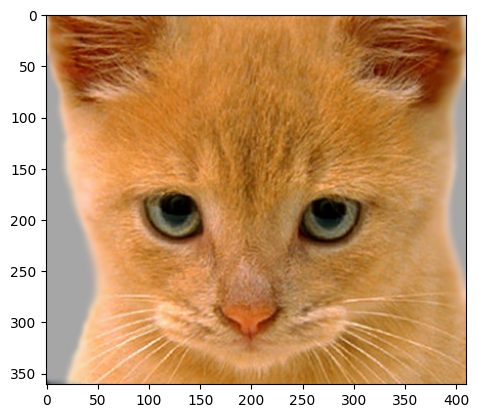

In [740]:
img1 = cv2.imread(r'../data/cat.bmp')
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)) 

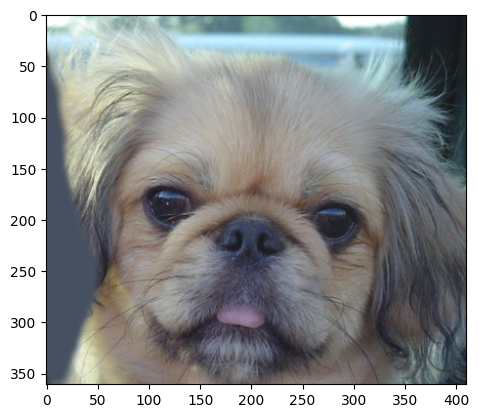

In [741]:
img2 = cv2.imread(r'../data/dog.bmp')
#visualize_image('original', img)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)) 

In [742]:
img1.shape

(361, 410, 3)

In [743]:
img2.shape

(361, 410, 3)

In [744]:
low_frequencies, high_frequencies, hybrid_image = gen_hybrid_image(img1, img2,7)

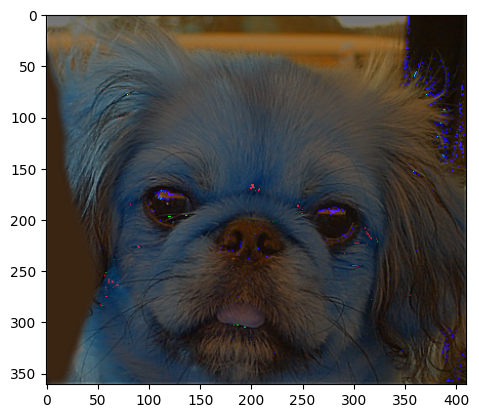

In [745]:
plt.imshow((high_frequencies))

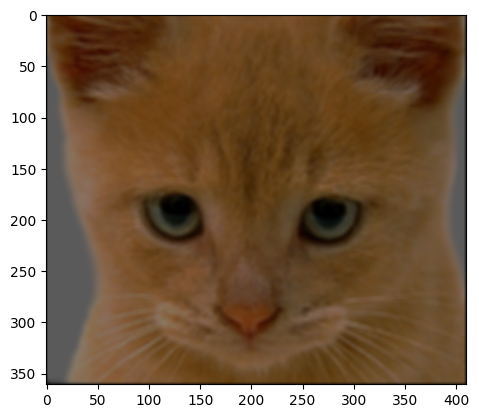

In [746]:
plt.imshow((low_frequencies)) 

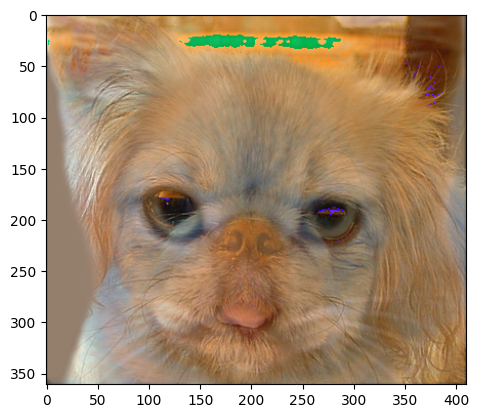

In [747]:
plt.imshow(hybrid_image)  

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


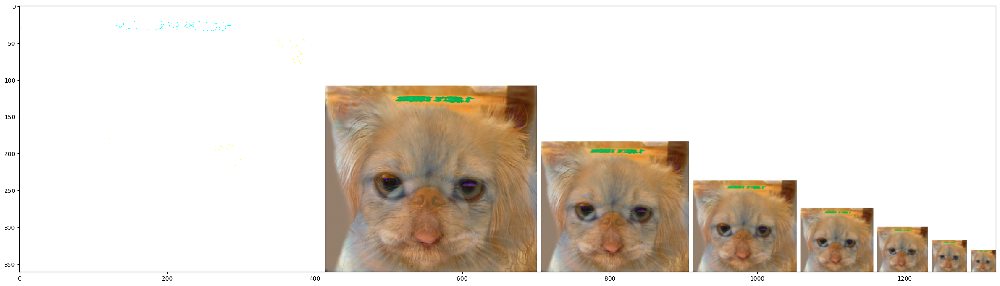

In [619]:
vis = vis_hybrid_image(hybrid_image)
plt.figure(figsize=(30, 20))
plt.imshow(vis)

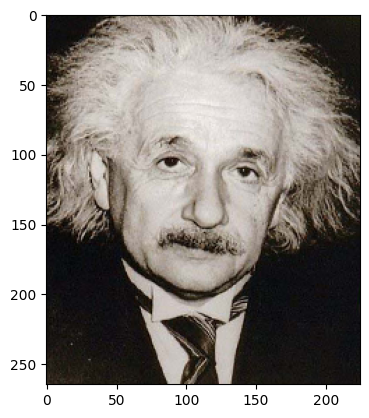

In [620]:
img3 = cv2.imread(r'../data/einstein.bmp')
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)) 

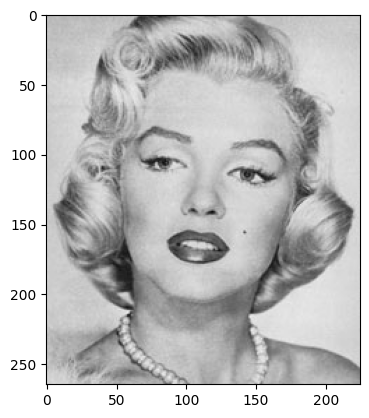

In [621]:
img4 = cv2.imread(r'../data/marilyn.bmp')
plt.imshow(cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)) 

In [622]:
low_frequencies2, high_frequencies2, hybrid_image2 = gen_hybrid_image(img4, img3, 7)

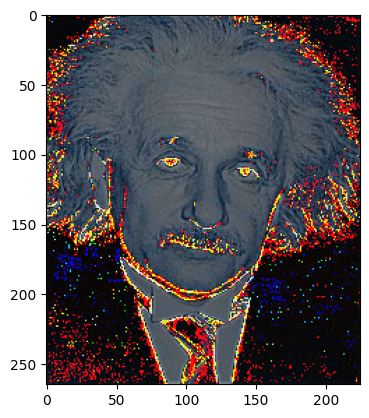

In [623]:
plt.imshow((high_frequencies2))

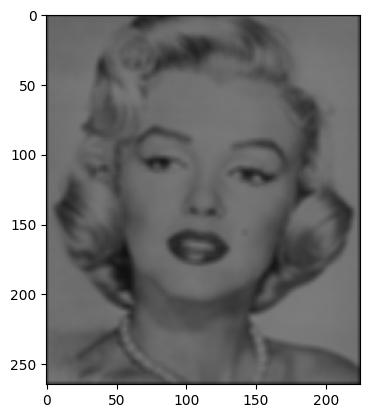

In [624]:
plt.imshow((low_frequencies2)) 

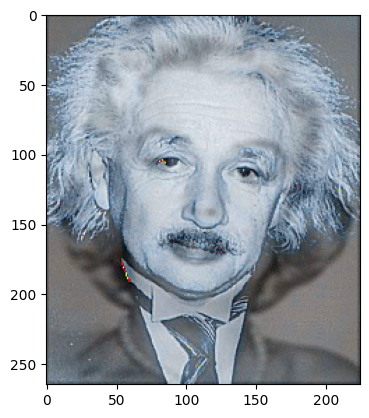

In [625]:
plt.imshow(hybrid_image2) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


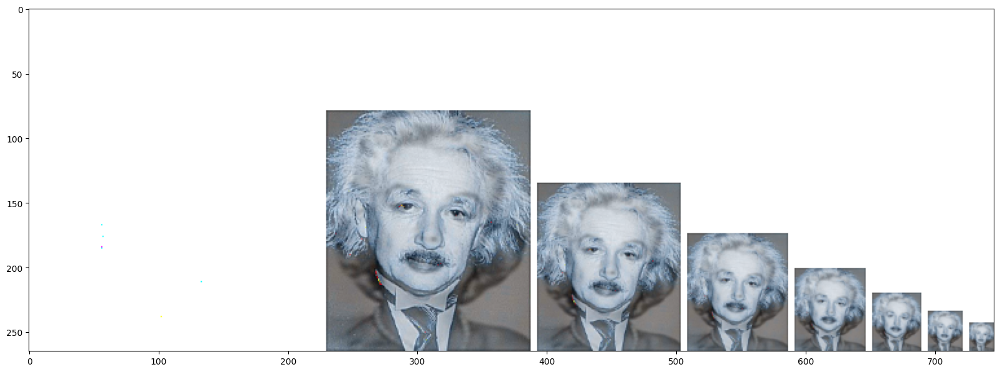

In [626]:
vis = vis_hybrid_image(hybrid_image2)
plt.figure(figsize=(20, 20))
plt.imshow(vis)

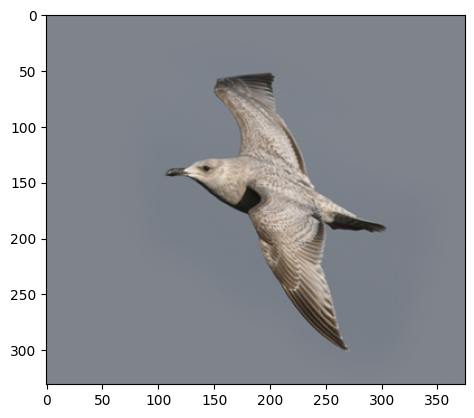

In [627]:
img5 = cv2.imread(r'../data/bird.bmp')
plt.imshow(cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)) 

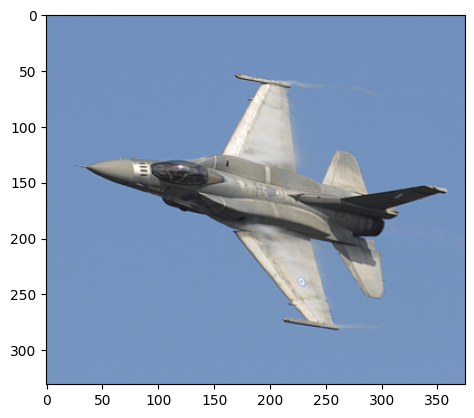

In [628]:
img6 = cv2.imread(r'../data/plane.bmp')
plt.imshow(cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)) 

In [629]:
low_frequencies3, high_frequencies3, hybrid_image3 = gen_hybrid_image(img5, img6, 7)

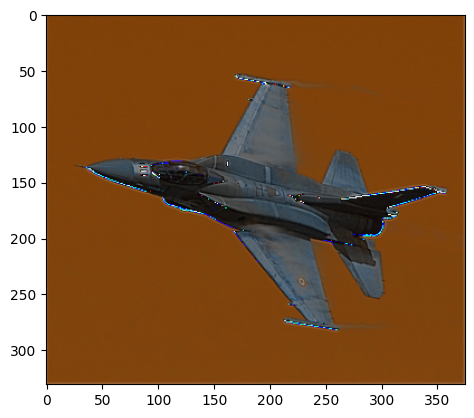

In [630]:
plt.imshow((high_frequencies3))

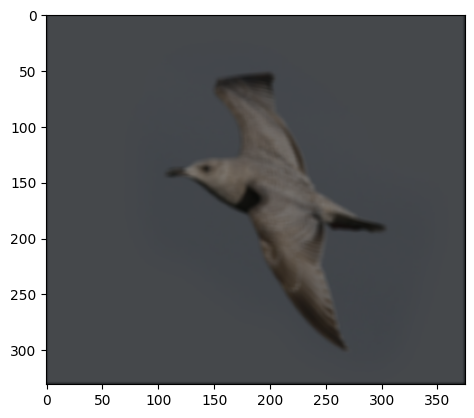

In [631]:
plt.imshow((low_frequencies3))

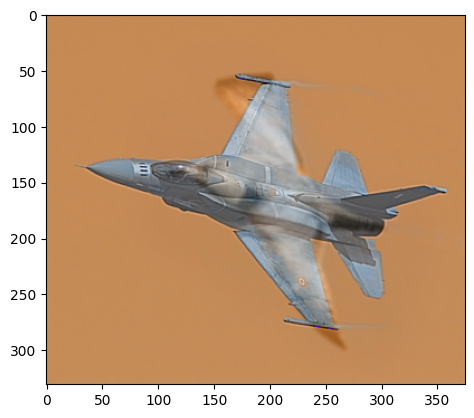

In [632]:
plt.imshow(hybrid_image3) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


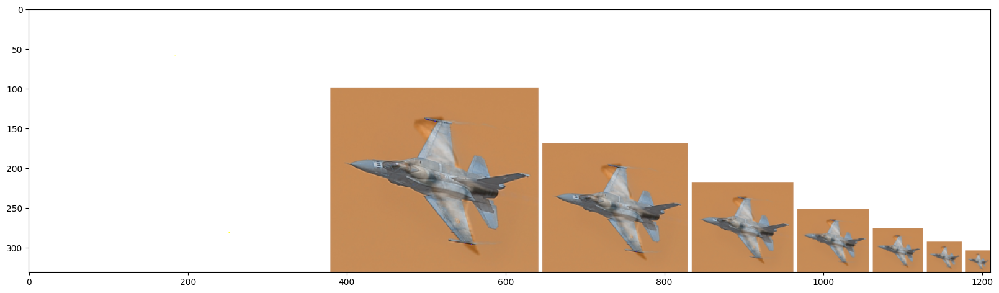

In [633]:
vis = vis_hybrid_image(hybrid_image3)
plt.figure(figsize=(20, 20))
plt.imshow(vis)

In [635]:

resultsDir = '..' + os.sep + 'results'
if not os.path.exists( resultsDir ):
    os.mkdir( resultsDir )

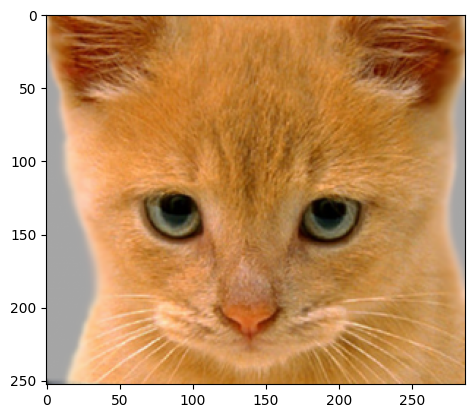

In [639]:
'''
Identity filter
This filter should do nothing regardless of the padding method you use.
'''
test_image = cv2.imread(r'../data/cat.bmp')
test_image = rescale(test_image, 0.7, mode='reflect',channel_axis=2)
plt.imshow(test_image)
identity_filter = np.asarray([[0, 0, 0], [0, 1, 0], [0, 0, 0]], dtype=np.float32)
identity_image = my_imfilter(test_image, identity_filter)
plt.imshow(identity_image)
done = save_image('../results/identity_image.jpg', identity_image)


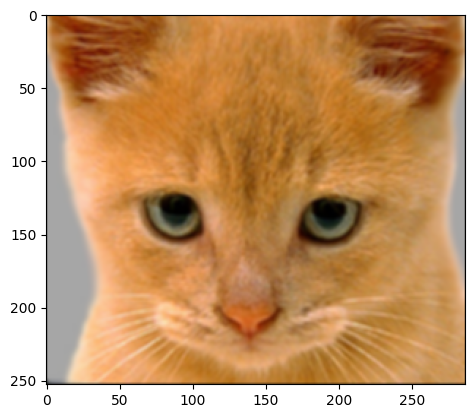

In [640]:

'''
Small blur with a box filter
This filter should remove some high frequencies.
'''
blur_filter = np.ones((3, 3), dtype=np.float32)
blur_filter /= np.sum(blur_filter, dtype=np.float32)  # making the filter sum to 1
blur_image = my_imfilter(test_image, blur_filter)
plt.imshow(blur_image)
done = save_image(resultsDir + os.sep + 'blur_image.jpg', blur_image)


In [748]:
blur_filter

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]], dtype=float32)

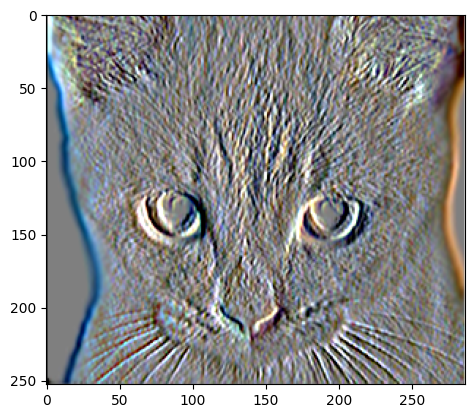

In [641]:
'''
Oriented filter (Sobel operator)
'''
sobel_filter = np.asarray([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)  # should respond to horizontal gradients
sobel_image = my_imfilter(test_image, sobel_filter)

# 0.5 added because the output image is centered around zero otherwise and mostly black
sobel_image = np.clip(sobel_image+0.5, 0.0, 1.0)
plt.imshow(sobel_image)
done = save_image(resultsDir + os.sep + 'sobel_image.jpg', sobel_image)


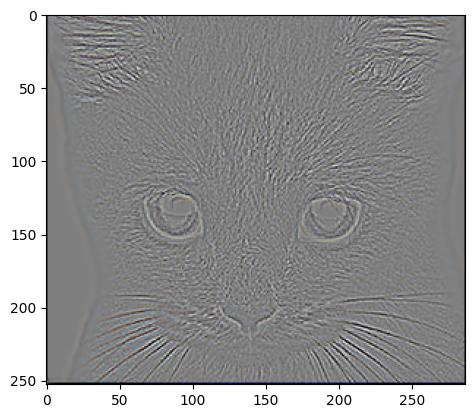

In [642]:

'''
High pass filter (discrete Laplacian)
'''
laplacian_filter = np.asarray([[0, 1, 0], [1, -4, 1], [0, 1, 0]], dtype=np.float32)
laplacian_image = my_imfilter(test_image, laplacian_filter)

# added because the output image is centered around zero otherwise and mostly black
laplacian_image = np.clip(laplacian_image+0.5, 0.0, 1.0)
plt.figure(); plt.imshow(laplacian_image)
done = save_image(resultsDir + os.sep + 'laplacian_image.jpg', laplacian_image)


In [749]:
laplacian_image

array([[[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.29647861],
        [0.        , 0.12393573, 0.386052  ],
        ...,
        [0.        , 0.        , 0.03825521],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.        , 0.        , 0.        ],
        [0.4797574 , 0.50020995, 0.51454234],
        [0.50246085, 0.53220905, 0.50570824],
        ...,
        [0.50083352, 0.49798542, 0.50494413],
        [0.48592097, 0.48383324, 0.46716426],
        [0.        , 0.        , 0.        ]],

       [[0.        , 0.        , 0.        ],
        [0.50114428, 0.50444573, 0.4922879 ],
        [0.5411984 , 0.53955593, 0.52112648],
        ...,
        [0.48421724, 0.49742785, 0.48975782],
        [0.49028927, 0.46022012, 0.45014901],
        [0.        , 0.        , 0.        ]],

       ...,

       [[0.33493571, 0.34677333, 0.32438901],
        [0.36223653, 0.35349651, 0.3613035 ],
        [0.4425667 , 0

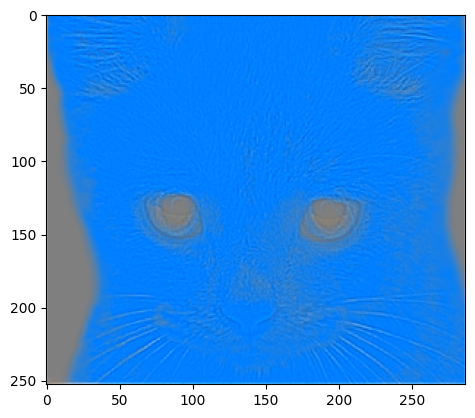

In [643]:

# High pass "filter" alternative
high_pass_image = test_image - blur_image
high_pass_image = np.clip(high_pass_image+0.5, 0.0, 1.0)
plt.figure(); plt.imshow(high_pass_image)
done = save_image(resultsDir + os.sep + 'high_pass_image.jpg', high_pass_image)


In [216]:
p1 = "../results/Cat_Dog.jpg"
save_image(p1, hybrid_image)
p2 = "../results/Einstein_Marlin.jpg"
save_image(p2, hybrid_image2)
p3 = "../results/Bird_Plane.jpg"
save_image(p3, hybrid_image3)

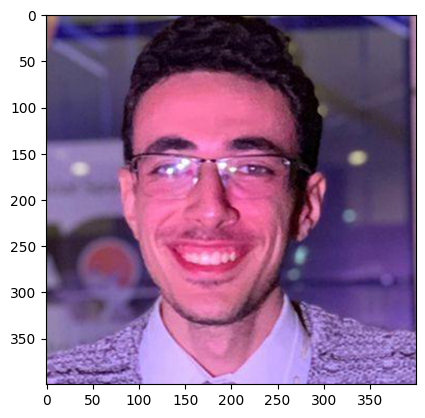

In [217]:
img_helmy = cv2.imread(r'../data/helmy2.bmp')
#visualize_image('original', img)
plt.imshow(cv2.cvtColor(img_helmy, cv2.COLOR_BGR2RGB)) 

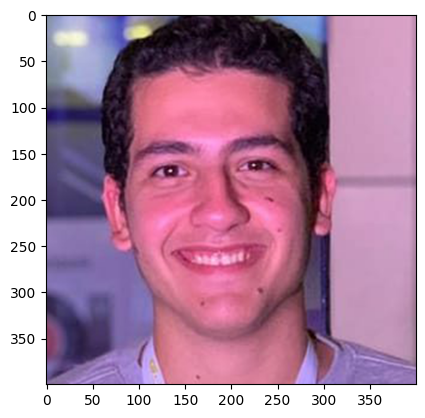

In [218]:
img_youssef = cv2.imread(r'../data/butcher2.bmp')
#visualize_image('original', img)
plt.imshow(cv2.cvtColor(img_youssef, cv2.COLOR_BGR2RGB)) 

In [225]:
low_frequencies_H_Y, high_frequencies_H_Y, hybrid_image_H_Y = gen_hybrid_image(img_youssef,img_helmy, 5)

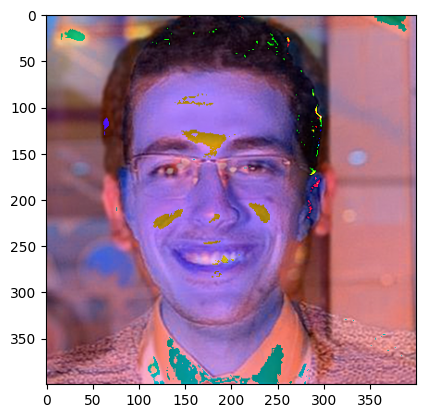

In [226]:
plt.imshow(hybrid_image_H_Y) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


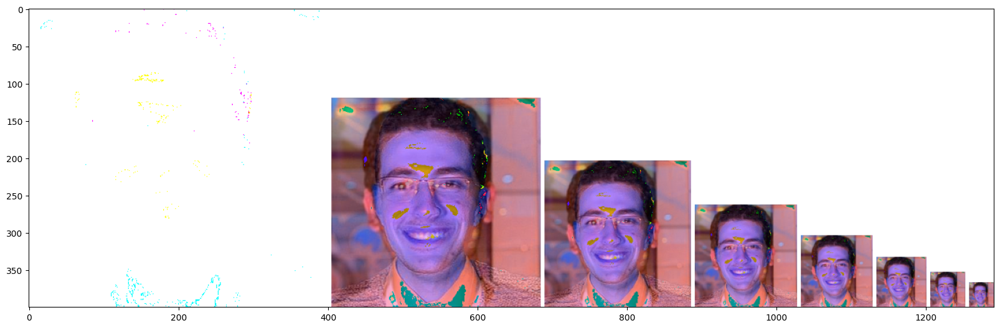

In [227]:
vis = vis_hybrid_image(hybrid_image_H_Y)
plt.figure(figsize=(20, 20))
plt.imshow(vis)

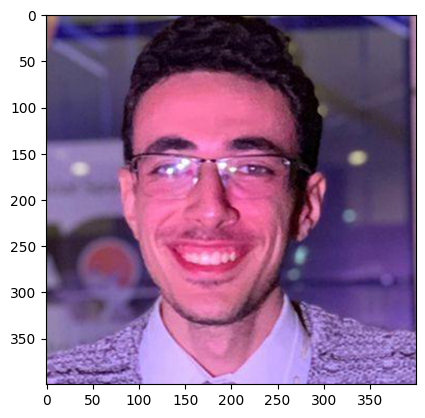

In [228]:
img_helmy = cv2.imread(r'../data/helmy2.bmp')
#visualize_image('original', img)
plt.imshow(cv2.cvtColor(img_helmy, cv2.COLOR_BGR2RGB)) 

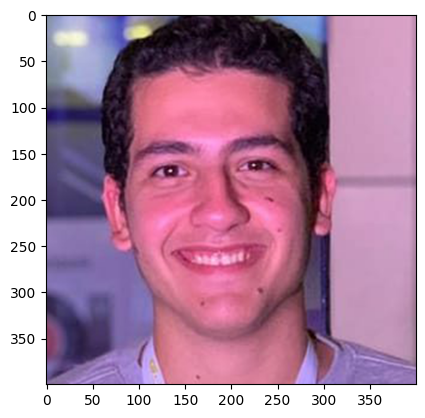

In [229]:
img_youssef = cv2.imread(r'../data/butcher2.bmp')
#visualize_image('original', img)
plt.imshow(cv2.cvtColor(img_youssef, cv2.COLOR_BGR2RGB)) 

In [230]:
low_frequencies_H_Y, high_frequencies_H_Y, hybrid_image_H_Y = gen_hybrid_image(img_helmy,img_youssef, 5)

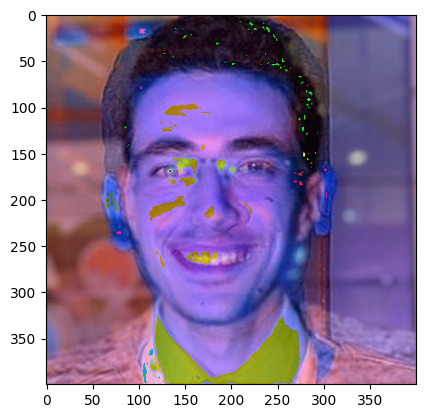

In [231]:
plt.imshow(hybrid_image_H_Y) 

In [644]:
p4 = "../results/hybrid_image_H_Y.jpg"
save_image(p4, hybrid_image_H_Y)

In [751]:
import time
large_1d_blur_filter = cv2.getGaussianKernel(13, 1)
large_blur_filter = np.dot(large_1d_blur_filter, large_1d_blur_filter.T)
t = time.time()
large_blur_image = my_imfilter(test_image, large_blur_filter)
t = time.time() - t
print('{:f} seconds'.format(t))

3.157987 seconds


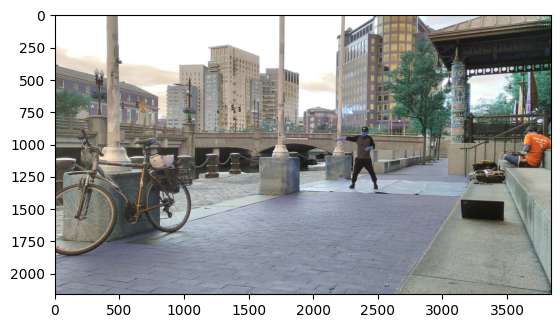

In [820]:
from scipy import signal
import matplotlib.pyplot as plt


Q4 = cv2.imread(r'../writeup/RISDance.jpg')
x = []
y = []
times = []
plt.imshow(Q4)
kSize = 5
cutoff_frequency = 7
kernel = create_gaussian_filter(kSize,cutoff_frequency)
for i in range(1,24):
    Q4 = rescale(Q4, i/10, mode='reflect',channel_axis=2)
    t = time.time()
    my_imfilter(Q4,kernel)
    t = time.time() - t
    x.append(Q4.shape[0])
    y.append(Q4.shape[1])
    times.append(t)


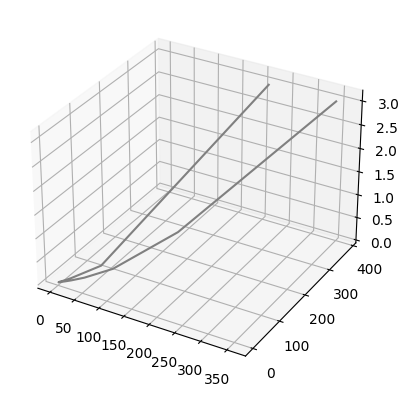

In [821]:

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot3D(x, y, times, 'gray')


In [834]:
Q4.shape

(540, 960, 3)

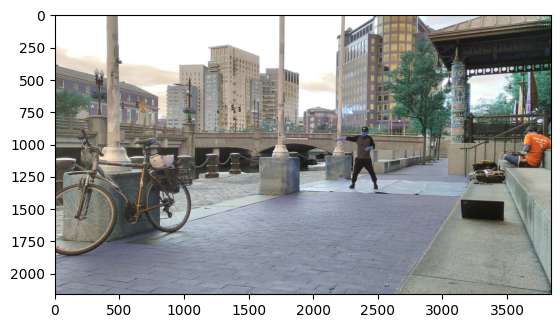

In [840]:
Q4 = cv2.imread(r'../writeup/RISDance.jpg')
x = []
y = []
times = []
plt.imshow(Q4)
cutoff_frequency = 7
for i in range(1,15,2):
    for j in range(25,100,25):
        kSize = i
        kernel = create_gaussian_filter(kSize,cutoff_frequency)
        filtered_image = rescale(Q4, j/100, mode='reflect',channel_axis=2)
        filtered_image = np.array(filtered_image)
        t = time.time()

        filtered_image[:,:,0] = correlate2d(filtered_image[:,:,0], kernel, 'same')
        filtered_image[:,:,1] = correlate2d(filtered_image[:,:,1], kernel, 'same')
        filtered_image[:,:,2] = correlate2d(filtered_image[:,:,2], kernel, 'same') 
   
        t = time.time() - t
        x.append(i)
        y.append(j/100)
        times.append(t)

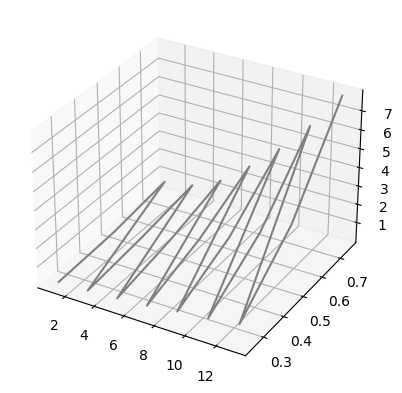

In [841]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot3D(x, y, times, 'gray')